In [3]:
import numpy as np
import cv2
import os
import torch
import math
from torch.nn import functional as F
from network import RRDBNet
import torch
from typing import Dict, List, Tuple
import time



input_path = "./input/OST_009.png"
output_path = "./output"

imgname, extension = os.path.splitext(os.path.basename(input_path))
img = cv2.imread(input_path, cv2.IMREAD_UNCHANGED)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


netscale = 4
model_path = "./weights/RealESRGAN_x4plus.pth"
model = RRDBNet(num_in_ch=3, num_out_ch=3, num_feat=64, num_block=23, num_grow_ch=32, scale=4)
outscale = 4

#1. scale image
img = img.astype(np.float32)
max_range = 255
img = img / max_range


#2. preprocess image
img = torch.from_numpy(np.transpose(img, (2, 0, 1))).float()
img = img.unsqueeze(0)


# 3. model inference
loadnet = torch.load(model_path, map_location=torch.device('cpu'))
model.load_state_dict(loadnet['params_ema'], strict=True)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
model.eval()

with torch.no_grad():
    img = img.to(device)
    output_img = model(img)


#4. post process
output_img = output_img.data.squeeze().float().cpu().clamp_(0, 1).numpy()
output_img = np.transpose(output_img[[2, 1, 0], :, :], (1, 2, 0))


#5. re-scale image
output = (output_img * 255.0).round().astype(np.uint8)

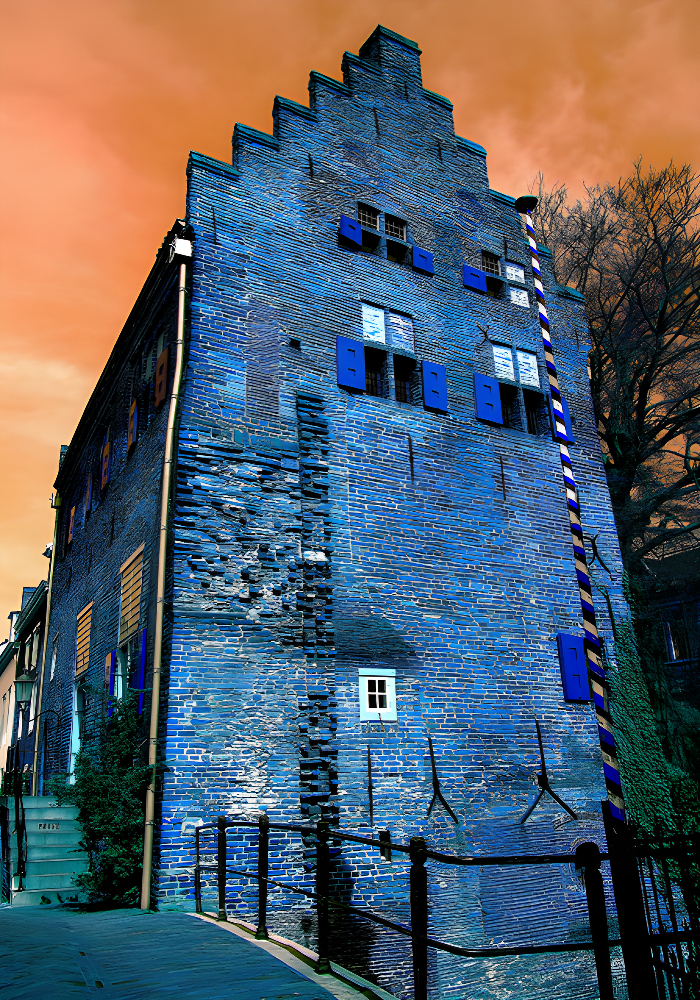

In [4]:
from PIL import Image
result = Image.fromarray(output)
display(result)

In [ ]:

#---------------------save image---------------------
extension = extension[1:]

save_path = os.path.join(output_path, f'{imgname}.{extension}')

cv2.imwrite(save_path, output)